## 导入必要模块

In [1]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
np.random.seed(2018)
import pandas as pd
import matplotlib.pyplot as plt
plt.style.use('seaborn-colorblind')
print(plt.style.available)
import seaborn as sns
import gc
import os
import time

from keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing.image import img_to_array
from keras.preprocessing.image import load_img

from keras.layers import Conv2D,MaxPooling2D,Flatten,Dropout
from keras.layers import Input,Dense,BatchNormalization,Activation
from keras.applications.xception import Xception
from keras.applications.xception import preprocess_input as xception_preprocessor
from keras.layers import Dense,GlobalMaxPool2D,Dropout,GlobalAvgPool2D
from keras.models import Model
from keras.callbacks import EarlyStopping,ReduceLROnPlateau,LearningRateScheduler
from keras.layers import concatenate
from keras.utils import plot_model

from keras.optimizers import Adam,SGD,RMSprop
from keras.metrics import categorical_crossentropy
from keras import regularizers,losses
from sklearn.model_selection import train_test_split

from os import makedirs
from os.path import expanduser,exists,join

['seaborn-colorblind', 'seaborn-poster', 'ggplot', 'seaborn-pastel', 'seaborn-dark-palette', 'seaborn-notebook', 'seaborn-darkgrid', 'seaborn-paper', 'seaborn-ticks', 'seaborn', 'seaborn-dark', '_classic_test', 'classic', 'bmh', 'Solarize_Light2', 'fast', 'dark_background', 'seaborn-talk', 'fivethirtyeight', 'seaborn-white', 'seaborn-bright', 'grayscale', 'seaborn-muted', 'seaborn-whitegrid', 'seaborn-deep']


Using TensorFlow backend.


In [2]:
!ls ../input/keras-pretrained-models/

Kuszma.JPG
imagenet_class_index.json
inception_resnet_v2_weights_tf_dim_ordering_tf_kernels.h5
inception_resnet_v2_weights_tf_dim_ordering_tf_kernels_notop.h5
inception_v3_weights_tf_dim_ordering_tf_kernels.h5
inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5
resnet50_weights_tf_dim_ordering_tf_kernels.h5
resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5
vgg16_weights_tf_dim_ordering_tf_kernels_notop.h5
xception_weights_tf_dim_ordering_tf_kernels.h5
xception_weights_tf_dim_ordering_tf_kernels_notop.h5


## 创建keras根目录

In [3]:
cache_dir = expanduser(join('~','.keras'))
if not exists(cache_dir):
    makedirs(cache_dir)
    
models_dir = join(cache_dir,'models')
if not exists(models_dir):
    makedirs(models_dir)

### 将keras预训练模型copy到keras/models目录中

In [4]:
!cp ../input/keras-pretrained-models/xception_weights_tf_dim_ordering_tf_kernels_notop.h5 ~/.keras/models
!cp ../input/keras-pretrained-models/*json ~/.keras/models/

In [5]:
!ls ~/.keras/models

imagenet_class_index.json  xception_weights_tf_dim_ordering_tf_kernels_notop.h5


Kaggle官方提供了train和test的两个文件夹，train文件夹中每张图片拥有唯一的标识id，labels.csv文件中包含train文件夹中图片id对应的狗的血统breed。test文件夹中图片就是此次竞赛需要预测的样本，sample_submission.csv中包含test文件夹中每张图片的唯一标识id。

In [6]:
train_folder = '../input/dog-breed-identification/train/'
test_folder = '../input/dog-breed-identification/test/'

In [7]:
train_dogs = pd.read_csv('../input/dog-breed-identification/labels.csv')
sub = pd.read_csv("../input/dog-breed-identification/sample_submission.csv")
display(train_dogs.head())
display(sub.head())

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,000621fb3cbb32d8935728e48679680e,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333
1,00102ee9d8eb90812350685311fe5890,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333
2,0012a730dfa437f5f3613fb75efcd4ce,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333
3,001510bc8570bbeee98c8d80c8a95ec1,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333
4,001a5f3114548acdefa3d4da05474c2e,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333


In [8]:
BreedCounts = train_dogs['breed'].value_counts().sort_values(ascending=False)

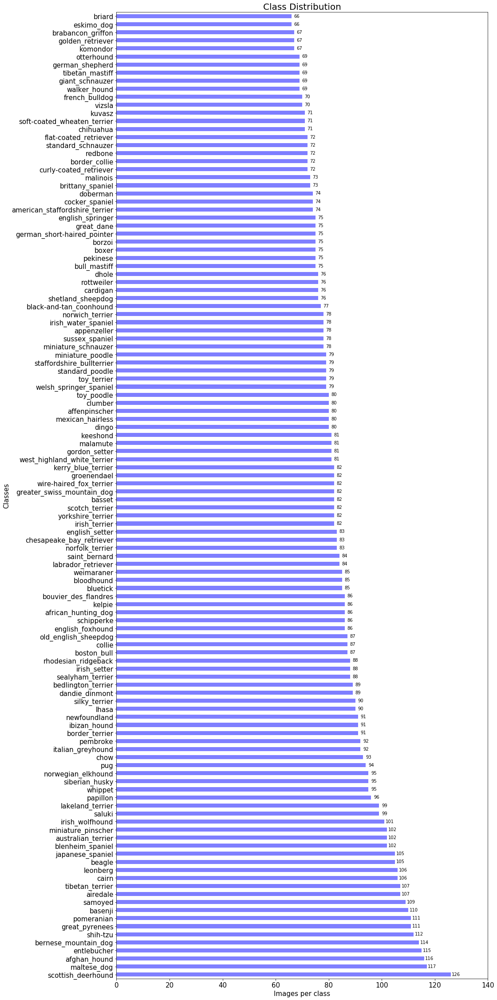

In [9]:
plt.figure(figsize=(15,40))
ax = BreedCounts.plot(kind='barh',fontsize=15,color='b',alpha=0.5)

rects = ax.patches
labels = BreedCounts.values
for rect,label in zip(rects,labels):
    width = rect.get_width()+2
    high = rect.get_y()
    ax.text(width, high,label,ha='center',va='bottom')

    plt.title('Class Distribution',fontsize=20)
plt.xlabel('Images per class',fontsize=15)
plt.xlim([0,140])
plt.ylabel('Classes',fontsize=15)
plt.show()

样本照片最多的类`scattish_deerhound`有126张，样本照片最少的类`briad`只有66张。一方面，此次Kaggle竞赛题属于小样本数据集，面对一个120个类别的分类题目，每个类最多只有100张图片，模型构建不好的时候，极容易发生过拟合的情况；另一方面，类别之间样本量有一定程度的不平衡，后续将讨论加入平衡处理操作之后，对预测结果的影响。

由于Kaggle官方kernel的最大运行内存为14G，keras预训练模型和神经网络训练过程会占用大量内存，因此，我们将图片大小resize到144x144，读取数据时，注意命名数据类型为int16。

In [10]:
top_num = 120
epochs = 30
img_size = 144
top_breeds = BreedCounts.head(top_num).index
train_dogs = train_dogs[train_dogs['breed'].isin(top_breeds)]

In [11]:
print(top_breeds)
print(train_dogs.shape)

Index(['scottish_deerhound', 'maltese_dog', 'afghan_hound', 'entlebucher',
       'bernese_mountain_dog', 'shih-tzu', 'great_pyrenees', 'pomeranian',
       'basenji', 'samoyed',
       ...
       'walker_hound', 'giant_schnauzer', 'tibetan_mastiff', 'german_shepherd',
       'otterhound', 'komondor', 'golden_retriever', 'brabancon_griffon',
       'eskimo_dog', 'briard'],
      dtype='object', length=120)
(10222, 2)


将train.csv文件中的breed列读取，并进行onehot encoding，得到每个品种唯一对应的0-1矩阵

In [12]:
target_labels = train_dogs['breed']
one_hot = pd.get_dummies(target_labels,sparse=True)
one_hot_names = one_hot.columns.tolist()
one_hot = one_hot.values
display(one_hot_names)

['affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier',
 'appenzeller',
 'australian_terrier',
 'basenji',
 'basset',
 'beagle',
 'bedlington_terrier',
 'bernese_mountain_dog',
 'black-and-tan_coonhound',
 'blenheim_spaniel',
 'bloodhound',
 'bluetick',
 'border_collie',
 'border_terrier',
 'borzoi',
 'boston_bull',
 'bouvier_des_flandres',
 'boxer',
 'brabancon_griffon',
 'briard',
 'brittany_spaniel',
 'bull_mastiff',
 'cairn',
 'cardigan',
 'chesapeake_bay_retriever',
 'chihuahua',
 'chow',
 'clumber',
 'cocker_spaniel',
 'collie',
 'curly-coated_retriever',
 'dandie_dinmont',
 'dhole',
 'dingo',
 'doberman',
 'english_foxhound',
 'english_setter',
 'english_springer',
 'entlebucher',
 'eskimo_dog',
 'flat-coated_retriever',
 'french_bulldog',
 'german_shepherd',
 'german_short-haired_pointer',
 'giant_schnauzer',
 'golden_retriever',
 'gordon_setter',
 'great_dane',
 'great_pyrenees',
 'greater_swiss_mountain_dog',
 'groenendael',


根据label.csv中的每张图片的id信息，新建每张图片读取的path路径

In [13]:
train_dogs['image_path'] = train_dogs['id'].apply(lambda x: train_folder + str(x) + '.jpg')
sub['image_path'] = sub['id'].apply(lambda x: test_folder + str(x) + '.jpg')
display(train_dogs.head())
display(sub.head())

,id,breed,image_path
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull,../input/dog-breed-identification/train/000bec...
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo,../input/dog-breed-identification/train/001513...
2,001cdf01b096e06d78e9e5112d419397,pekinese,../input/dog-breed-identification/train/001cdf...
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick,../input/dog-breed-identification/train/00214f...
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever,../input/dog-breed-identification/train/0021f9...


,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier,image_path
0,000621fb3cbb32d8935728e48679680e,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,../input/dog-breed-identification/test/000621f...
1,00102ee9d8eb90812350685311fe5890,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,../input/dog-breed-identification/test/00102ee...
2,0012a730dfa437f5f3613fb75efcd4ce,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,../input/dog-breed-identification/test/0012a73...
3,001510bc8570bbeee98c8d80c8a95ec1,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,../input/dog-breed-identification/test/001510b...
4,001a5f3114548acdefa3d4da05474c2e,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,../input/dog-breed-identification/test/001a5f3...


在每个品种中，随机选取一张图片进行可视化，我们可以察觉到，144x144的分辨率，确实损失了一部分的信息，但总体上来说，还是可以很大程度上辨别出宠物狗的样子。官方提供的数据集，存在很多背景物品，有些还跟宠物狗一样，可能是毛茸茸的，或者颜色相近，这都给分类识别带来了一定阻力。而且，狗的年龄差异还是挺明显的，有幼年狗也有成年狗。

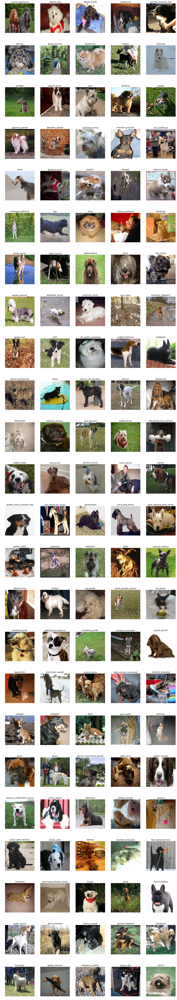

In [14]:
row_imgs = 5
col_imgs = top_num//row_imgs
plt.figure(figsize=(20,5*col_imgs))
for i in range(col_imgs):
    for j in range(row_imgs):
        breed = top_breeds.tolist()[i*5+j]
        image = load_img(path=train_dogs.loc[train_dogs['breed']==breed,'image_path'].values.tolist()[0],target_size=(img_size,img_size))
        image = img_to_array(img=image)/255
        plt.subplot2grid((col_imgs,row_imgs),(i,j))
        plt.imshow(image)
        plt.title(breed)
        plt.axis('off')
plt.show()

读取train文件夹中的图片，将图片尺寸限定在(150,150)，方便直接用于预训练模型的输入，同时，直接利用keras提供的预处理函数，对每张图片的通道信息做归一化处理。预处理函数，通过keras的Lambda自定义层，直接嵌入到模型的搭建中去。

In [15]:
help(xception_preprocessor)

Help on function preprocess_input in module keras.applications.xception:

preprocess_input(x)
    Preprocesses a numpy array encoding a batch of images.
    
    # Arguments
        x: a 4D numpy array consists of RGB values within [0, 255].
    
    # Returns
        Preprocessed array.



In [16]:
train_data = np.array([img_to_array(load_img(img, target_size=(img_size,img_size))) for img in train_dogs['image_path'].values.tolist()]).astype('int16')

将数据集划分为训练数据集和验证数据集，比例8:2，stratify会保持target_labels分布保持与原始数据集一直。为了尽可能节省内存，完成之后删除train_data数据。

In [17]:
x_train,x_valid,y_train,y_valid = train_test_split(train_data,
                                                   one_hot,
                                                   test_size=0.2,
                                                   stratify=np.array(target_labels),
                                                   random_state=2018)
del train_data
gc.enable()
gc.collect()

260253

In [18]:
print('x_train shape: {}'.format(x_train.shape))
print('x_valid shape: {}'.format(x_valid.shape))
print('y_train shape: {}'.format(y_train.shape))
print('y_valid shape: {}'.format(y_valid.shape))

x_train shape: (8177, 144, 144, 3)
x_valid shape: (2045, 144, 144, 3)
y_train shape: (8177, 120)
y_valid shape: (2045, 120)


在这里，我们没敢把batch_size设置的太小，担心这种多分类问题，在数据集过小的情况下，无法正常收敛，因此将其设置为120。

In [19]:
batch_size = 1 * top_num

图片数据增强的内容包括随机旋转、随机放缩和随机平移，幅度都没有开的很大，担心这样的操作使得训练过程不收敛。（后续的实验过程已经一定程度上出现了这种状况，训练集的误差一直比测试集的误差要大的多）。full_generator是将所有训练集的数据都用来做增强，训练过程不设置validation数据集。

In [20]:
train_daragen = ImageDataGenerator(rotation_range=45,zoom_range=0.15,width_shift_range=0.15,height_shift_range=0.15,fill_mode='nearest',horizontal_flip=False)
train_generator = train_daragen.flow(x_train, y_train,batch_size=batch_size,seed=2018)
full_generator = train_daragen.flow(np.concatenate([x_train,x_valid],axis=0),np.concatenate([y_train,y_valid],axis=0),batch_size=batch_size,seed=2018)

In [21]:
from keras.layers import Conv2D,MaxPooling2D,Flatten,Dropout
from keras.layers import Input,Dense,Activation,Lambda

我们自行搭建过一个简单的卷积网络，SimpleCNN在训练集中的损失函数很快下降到接近0，准确度逐渐达到99%，而验证集的损失函数一直很高，甚至有上升的趋势，准确度只有不到5%。这是非常典型的过拟合现象。

在神经网络的训练技巧学习中，我们有一些比较好的方法可以一定程度上减弱过拟合现象。一是给模型加正则惩罚，包括L1和L2正则，使得网络的权重得到一定的限制；二是增加训练数据，这里我们使用DataAugmentation的方法，随机的扩增数据用于训练；三是加入EarlyStopping，当验证损失函数不在下降，停止训练。四是使用Dropout，在SimpleCNN中，我们可以考虑在池化操作之后使用Dropout，增加模型的泛化能力。

SimpleCNN在进行了上述抑制过拟合的操作后，训练过程的过拟合得到一定程度的约束，然而，经过长时间的训练后，仍然会发生过拟合，验证误差也大概在5-6%左右，并没有得到改善。

## Using a pre-trained model

### Feature extraction特征提取

预训练模型可以用来当作特征提取，去掉分类用的全连接层，我们将新的图片样本作为输入，仅让预训练模型输出前面卷积操作的最后的特征输出，将这些输出的特征作为新的样本数据，去训练一个新的分类模型。这个时候的分类模型，可以是我们在传统机器学习方法中的任何一个，LogisticsRegression，SVC，KNN等等。

在这里，我们没有采取上述方式，我们将预训练的Xception模型作为特征提取层（要手工设定预训练模型的权值不得被更改），后接了一层全连接层，最终输出预测结果。

In [22]:
base_model = Xception(weights='imagenet',include_top=False,input_shape=(img_size,img_size,3),pooling='avg')
for layer in base_model.layers:
    layer.trainable = False

全连接层之后加了一个dropout层，一定程度上抑制可能发生的过拟合

In [23]:
inputs = Input(shape=(img_size,img_size,3))
x = Lambda(function=xception_preprocessor,name='preprocessing')(inputs)
x = base_model(x)
x = Dense(units=512,kernel_initializer='lecun_normal',activation='selu')(x)
x = Dropout(0.5)(x)
x = Dense(units=256,kernel_initializer='lecun_normal',activation='selu')(x)
x = Dropout(0.5)(x)
outputs = Dense(units=top_num,kernel_initializer='lecun_normal',activation='softmax')(x)
model = Model(inputs=inputs,outputs=outputs)
model.compile(optimizer=RMSprop(lr=1e-3),loss='categorical_crossentropy',metrics=['acc'])

这里设置了一个learning_rate随训练过程减小的函数，在前30代，学习率从一开始的1e-3，逐渐下降到1e-5，30代之后都保持1e-5的学习率，能够在一定程度上，让优化算法在进行到后期实现收敛。

In [24]:
def scheduler(epoch):
    lr = 1e-3
    if (epoch > 0) and (epoch <= 15):
        lr = 1e-3 - (1e-3-1e-4)/15. * (epoch-0)
    if (epoch > 15) and (epoch <= 30):
        lr = 1e-4 - (1e-4-1e-5)/15. * (epoch-10)
    if (epoch > 30):
        lr = 1e-5
    return lr

In [25]:
EarlyStop = EarlyStopping(monitor='val_acc',patience=30,verbose=1)
Reduce = ReduceLROnPlateau(monitor='val_acc',patience=5,min_lr=1e-6,factor=0.5,verbose=1)
LearnRate = LearningRateScheduler(scheduler,verbose=1)

In [26]:
print(model.summary())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 144, 144, 3)       0         
_________________________________________________________________
preprocessing (Lambda)       (None, 144, 144, 3)       0         
_________________________________________________________________
xception (Model)             (None, 2048)              20861480  
_________________________________________________________________
dense_1 (Dense)              (None, 512)               1049088   
_________________________________________________________________
dropout_1 (Dropout)          (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 120)               61560     
Total params: 21,972,128
Trainable params: 1,110,648
Non-trainable params: 20,861,480
________________________________________________________

模型总参数量达到21百万，其中实际需要训练的只有1百万个参数。

In [28]:
history = model.fit(x=x_train,y=y_train,batch_size=batch_size,epochs=epochs,validation_data=(x_valid,y_valid),verbose=1,callbacks=[EarlyStop,LearnRate],shuffle=False)

Train on 8177 samples, validate on 2045 samples
Epoch 1/30

Epoch 00001: LearningRateScheduler reducing learning rate to 0.001.
8177/8177 [==============================] - 54s 7ms/step - loss: 3.5531 - acc: 0.2343 - val_loss: 2.4556 - val_acc: 0.4298
Epoch 2/30

Epoch 00002: LearningRateScheduler reducing learning rate to 0.00094.
8177/8177 [==============================] - 47s 6ms/step - loss: 2.5579 - acc: 0.4090 - val_loss: 2.3576 - val_acc: 0.4914
Epoch 3/30

Epoch 00003: LearningRateScheduler reducing learning rate to 0.00088.
8177/8177 [==============================] - 47s 6ms/step - loss: 2.2051 - acc: 0.4814 - val_loss: 2.3993 - val_acc: 0.4954
Epoch 4/30

Epoch 00004: LearningRateScheduler reducing learning rate to 0.00082.
8177/8177 [==============================] - 47s 6ms/step - loss: 1.9573 - acc: 0.5381 - val_loss: 2.4328 - val_acc: 0.5115
Epoch 5/30

Epoch 00005: LearningRateScheduler reducing learning rate to 0.00076.
8177/8177 [==============================] - 47s

In [29]:
epoch_range = history.epoch
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

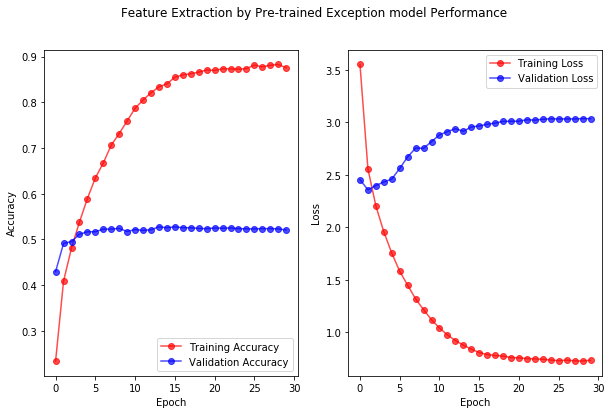

In [30]:
plt.figure(figsize=(10,6))
plt.suptitle('Feature Extraction by Pre-trained Exception model Performance')
plt.subplot(121)
plt.plot(epoch_range,acc,'o-',c='r',alpha=0.7,label='Training Accuracy')
plt.plot(epoch_range,val_acc,'o-',c='b',alpha=0.7,label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='best')

plt.subplot(122)
plt.plot(epoch_range,loss,'o-',c='r',alpha=0.7,label='Training Loss')
plt.plot(epoch_range,val_loss,'o-',c='b',alpha=0.7,label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='best')
plt.show()

从上图我们可以发现，虽然我们已经设置了dropout和learning_rate下降的操作，仍然没有抑制过拟合的发生。训练集准度率逐渐达到88.3%，而验证集的准确率仅为52.5%。数据集过小，而我们搭建的CNN模型的表示能力过强，仍然是本任务不可回避的根本问题。

In [31]:
gc.enable()
gc.collect()

35937

### Pre-trained model with Data-Augmentation

In [32]:
base_model = Xception(weights='imagenet',include_top=False,input_shape=(img_size,img_size,3),pooling='avg')
for layer in base_model.layers:
    layer.trainable = False

In [33]:
inputs = Input(shape=(img_size,img_size,3))
x = Lambda(function=xception_preprocessor,name='preprocessing')(inputs)
x = base_model(x)
x = Dense(units=512,kernel_initializer='lecun_normal',activation='selu')(x)
x = Dropout(0.5)(x)
x = Dense(units=256,kernel_initializer='lecun_normal',activation='selu')(x)
x = Dropout(0.5)(x)
outputs = Dense(units=top_num,kernel_initializer='lecun_normal',activation='softmax')(x)
model = Model(inputs=inputs,outputs=outputs)
model.compile(optimizer=RMSprop(lr=1e-3),loss='categorical_crossentropy',metrics=['acc'])

In [34]:
model.compile(loss='categorical_crossentropy',optimizer=RMSprop(lr=1e-3),metrics=['acc'])
print(model.summary())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         (None, 144, 144, 3)       0         
_________________________________________________________________
preprocessing (Lambda)       (None, 144, 144, 3)       0         
_________________________________________________________________
xception (Model)             (None, 2048)              20861480  
_________________________________________________________________
dense_3 (Dense)              (None, 512)               1049088   
_________________________________________________________________
dropout_2 (Dropout)          (None, 512)               0         
_________________________________________________________________
dense_4 (Dense)              (None, 120)               61560     
Total params: 21,972,128
Trainable params: 1,110,648
Non-trainable params: 20,861,480
________________________________________________________

在这一部分中，模型搭建与上一步中的完全一直，仅是训练数据采用了数据增强随机产生的结果。

In [35]:
history = model.fit_generator(generator=train_generator,steps_per_epoch=len(x_train)//batch_size+1,epochs=int(2*epochs),validation_data=(x_valid,y_valid),verbose=1,callbacks=[EarlyStop,LearnRate],shuffle=False)

Epoch 1/60

Epoch 00001: LearningRateScheduler reducing learning rate to 0.001.
69/69 [==============================] - 75s 1s/step - loss: 4.0066 - acc: 0.1429 - val_loss: 2.6340 - val_acc: 0.3946
Epoch 2/60

Epoch 00002: LearningRateScheduler reducing learning rate to 0.00094.
69/69 [==============================] - 64s 934ms/step - loss: 3.2714 - acc: 0.2495 - val_loss: 2.6729 - val_acc: 0.4367
Epoch 3/60

Epoch 00003: LearningRateScheduler reducing learning rate to 0.00088.
69/69 [==============================] - 65s 938ms/step - loss: 3.0899 - acc: 0.2822 - val_loss: 2.3254 - val_acc: 0.4822
Epoch 4/60

Epoch 00004: LearningRateScheduler reducing learning rate to 0.00082.
69/69 [==============================] - 64s 930ms/step - loss: 2.9375 - acc: 0.3069 - val_loss: 2.1749 - val_acc: 0.5188
Epoch 5/60

Epoch 00005: LearningRateScheduler reducing learning rate to 0.00076.
69/69 [==============================] - 64s 925ms/step - loss: 2.8473 - acc: 0.3196 - val_loss: 2.1245 - v

Epoch 40/60

Epoch 00040: LearningRateScheduler reducing learning rate to 1e-05.
69/69 [==============================] - 64s 930ms/step - loss: 2.3780 - acc: 0.4241 - val_loss: 2.0486 - val_acc: 0.5599
Epoch 41/60

Epoch 00041: LearningRateScheduler reducing learning rate to 1e-05.
69/69 [==============================] - 64s 935ms/step - loss: 2.4000 - acc: 0.4138 - val_loss: 2.0486 - val_acc: 0.5628
Epoch 42/60

Epoch 00042: LearningRateScheduler reducing learning rate to 1e-05.
69/69 [==============================] - 64s 928ms/step - loss: 2.3756 - acc: 0.4197 - val_loss: 2.0480 - val_acc: 0.5623
Epoch 00042: early stopping


In [36]:
epoch_range = history.epoch
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

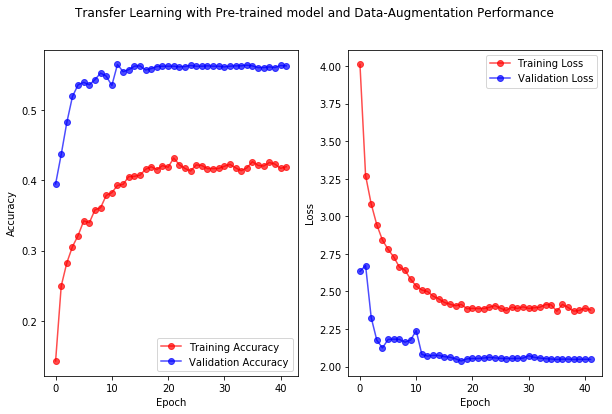

In [37]:
plt.figure(figsize=(10,6))
plt.suptitle('Transfer Learning with Pre-trained model and Data-Augmentation Performance')
plt.subplot(121)
plt.plot(epoch_range,acc,'o-',c='r',alpha=0.7,label='Training Accuracy')
plt.plot(epoch_range,val_acc,'o-',c='b',alpha=0.7,label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='best')

plt.subplot(122)
plt.plot(epoch_range,loss,'o-',c='r',alpha=0.7,label='Training Loss')
plt.plot(epoch_range,val_loss,'o-',c='b',alpha=0.7,label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='best')
plt.show()

有了ImageAugmentation的加持，我们的模型仿佛加上了一副镣铐，训练集上的准确率被限制到没有超过过50%，这种情况，猜想可以通过增加预训练模型后接的全连接层的复杂度能够得到一定的改善。之后会进行相关实验验证。值得我们关注的是，增加了ImageAugmentation操作后，我们模型在验证集上的准确率确实得到了改善，达到56.4%，相比于之前的52.5%还是有不少进步的。

In [38]:
gc.enable()
gc.collect()

42426

### Fine-tuning transfer learning
微调是指预训练模型作为初始，在训练过程中，选择其中一些层的权值可以被训练。对于图像识别任务，一般建议把靠近全连接分类层的特征提取层设置为可训练的。因为越是早期的层，可以学习到一些共性的图像识别的底层特征，比如一些边框和颜色之类，而越深的层，得到的是越抽象的特征组合，比如某个神经元可能对应的就是眼睛的颜色或者鼻子的大小。在这里，我们将预训练特征提取层的最后一个卷积层设置为可训练的，同时，模型的学习率设置的小一些。

In [42]:
base_model = Xception(weights='imagenet',include_top=False,input_shape=(img_size,img_size,3),pooling='avg')

# 将block14_conv2之后的层设置为可训练
set_trainable = False
for layer in base_model.layers:
    if layer.name == 'block14_sepconv2':
        set_trainable = True
    if set_trainable:
        layer.trainable = True
    else:
        layer.trainable = False

In [43]:
inputs = Input(shape=(img_size,img_size,3))
x = Lambda(function=xception_preprocessor,name='preprocessing')(inputs)
x = base_model(x)
x = Dense(units=512,kernel_initializer='lecun_normal',activation='selu')(x)
x = Dropout(0.5)(x)
x = Dense(units=256,kernel_initializer='lecun_normal',activation='selu')(x)
x = Dropout(0.5)(x)
outputs = Dense(units=top_num,kernel_initializer='lecun_normal',activation='softmax')(x)
model = Model(inputs=inputs,outputs=outputs)
model.compile(optimizer=RMSprop(lr=5e-5),loss='categorical_crossentropy',metrics=['acc'])

In [44]:
history = model.fit_generator(generator=train_generator,steps_per_epoch=len(x_train)//batch_size+1,epochs=int(2*epochs),validation_data=(x_valid,y_valid),verbose=1,callbacks=[EarlyStop],shuffle=False)

Epoch 1/60
69/69 [==============================] - 77s 1s/step - loss: 4.7164 - acc: 0.0260 - val_loss: 3.8699 - val_acc: 0.1795
Epoch 2/60
69/69 [==============================] - 66s 956ms/step - loss: 4.4676 - acc: 0.0866 - val_loss: 3.0977 - val_acc: 0.3125
Epoch 3/60
69/69 [==============================] - 66s 952ms/step - loss: 4.2400 - acc: 0.1499 - val_loss: 2.5852 - val_acc: 0.3853
Epoch 4/60
69/69 [==============================] - 65s 941ms/step - loss: 4.0394 - acc: 0.1863 - val_loss: 2.2871 - val_acc: 0.4328
Epoch 5/60
69/69 [==============================] - 66s 951ms/step - loss: 3.8492 - acc: 0.2180 - val_loss: 2.1253 - val_acc: 0.4641
Epoch 6/60
69/69 [==============================] - 66s 955ms/step - loss: 3.7183 - acc: 0.2352 - val_loss: 2.0382 - val_acc: 0.4773
Epoch 7/60
69/69 [==============================] - 66s 958ms/step - loss: 3.5735 - acc: 0.2653 - val_loss: 2.0028 - val_acc: 0.4919
Epoch 8/60
69/69 [==============================] - 66s 955ms/step - los

In [45]:
epoch_range = history.epoch
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

经过60个epoch优化fine-tuning，最终得到验证集上准确率为57.0%，略微比只是transfer learning的模型有些许改善，另外，我们应该注意到，fine-tuning在训练集上的准确率也由42%提高到了45%。

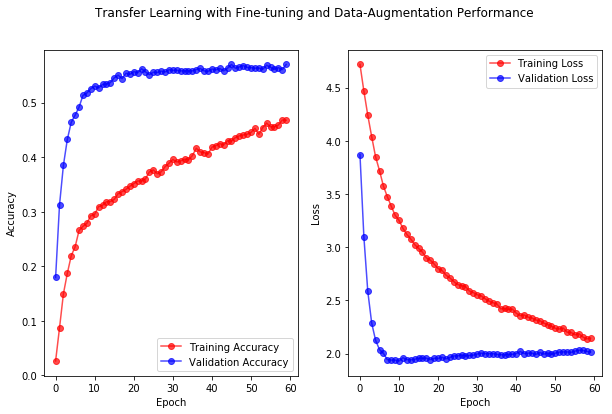

In [46]:
plt.figure(figsize=(10,6))
plt.suptitle('Transfer Learning with Fine-tuning and Data-Augmentation Performance')
plt.subplot(121)
plt.plot(epoch_range,acc,'o-',c='r',alpha=0.7,label='Training Accuracy')
plt.plot(epoch_range,val_acc,'o-',c='b',alpha=0.7,label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='best')

plt.subplot(122)
plt.plot(epoch_range,loss,'o-',c='r',alpha=0.7,label='Training Loss')
plt.plot(epoch_range,val_loss,'o-',c='b',alpha=0.7,label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='best')
plt.show()

将分割出去的验证数据valid也加入到模型训练中，在之前的模型训练基础上，再增加10个epoch的训练

In [47]:
history = model.fit_generator(generator=full_generator,steps_per_epoch=len(target_labels)//batch_size+1,epochs=10,verbose=1,shuffle=True)

Epoch 1/10
86/86 [==============================] - 74s 861ms/step - loss: 2.2510 - acc: 0.4420
Epoch 2/10
86/86 [==============================] - 73s 854ms/step - loss: 2.2282 - acc: 0.4434
Epoch 3/10
86/86 [==============================] - 74s 858ms/step - loss: 2.2143 - acc: 0.4519
Epoch 4/10
86/86 [==============================] - 74s 859ms/step - loss: 2.2285 - acc: 0.4489
Epoch 5/10
86/86 [==============================] - 74s 859ms/step - loss: 2.2130 - acc: 0.4515
Epoch 6/10
86/86 [==============================] - 72s 838ms/step - loss: 2.1903 - acc: 0.4539
Epoch 7/10
86/86 [==============================] - 73s 851ms/step - loss: 2.1733 - acc: 0.4571
Epoch 8/10
86/86 [==============================] - 73s 855ms/step - loss: 2.1631 - acc: 0.4615
Epoch 9/10
86/86 [==============================] - 72s 833ms/step - loss: 2.1528 - acc: 0.4675
Epoch 10/10
86/86 [==============================] - 74s 858ms/step - loss: 2.1634 - acc: 0.4606


In [48]:
del x_train,x_valid,y_train,y_valid
gc.enable()
gc.collect()
time.sleep(60)

### 读取测试数据集

In [49]:
test_data = np.array([img_to_array(load_img(img, target_size=(img_size,img_size))) for img in sub['image_path'].values.tolist()]).astype('int16')

#### 输出预测结果

In [50]:
test_pred = model.predict(x=test_data,verbose=1,batch_size=2*batch_size)
test_pred = np.clip(test_pred,0.05,0.95)

10357/10357 [==============================] - 65s 6ms/step


In [51]:
test_pred = pd.DataFrame(data=test_pred,columns=one_hot_names)
display(test_pred.head())
print(test_pred.shape)

,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,...,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05
1,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,...,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05
2,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,...,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05
3,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,...,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05
4,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,...,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05


(10357, 120)


In [52]:
test_pred['id'] = sub['id'].values

In [53]:
display(test_pred.head())
print(test_pred.shape)

,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,...,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier,id
0,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,...,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,000621fb3cbb32d8935728e48679680e
1,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,...,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,00102ee9d8eb90812350685311fe5890
2,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,...,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0012a730dfa437f5f3613fb75efcd4ce
3,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,...,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,001510bc8570bbeee98c8d80c8a95ec1
4,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,...,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,001a5f3114548acdefa3d4da05474c2e


(10357, 121)


确定仅包含predict结果中的狗品种和id列，同时按照sub中的顺序重新排列

In [54]:
sub_columns = [col for col in sub.columns.tolist() if col in test_pred.columns.tolist()]
print(sub_columns)

['id', 'affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale', 'american_staffordshire_terrier', 'appenzeller', 'australian_terrier', 'basenji', 'basset', 'beagle', 'bedlington_terrier', 'bernese_mountain_dog', 'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound', 'bluetick', 'border_collie', 'border_terrier', 'borzoi', 'boston_bull', 'bouvier_des_flandres', 'boxer', 'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff', 'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua', 'chow', 'clumber', 'cocker_spaniel', 'collie', 'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo', 'doberman', 'english_foxhound', 'english_setter', 'english_springer', 'entlebucher', 'eskimo_dog', 'flat-coated_retriever', 'french_bulldog', 'german_shepherd', 'german_short-haired_pointer', 'giant_schnauzer', 'golden_retriever', 'gordon_setter', 'great_dane', 'great_pyrenees', 'greater_swiss_mountain_dog', 'groenendael', 'ibizan_hound', 'irish_setter', 'irish_terrier',

In [55]:
test_pred = test_pred[sub_columns]
display(test_pred.head())
display(sub.head())

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,000621fb3cbb32d8935728e48679680e,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,...,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05
1,00102ee9d8eb90812350685311fe5890,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,...,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05
2,0012a730dfa437f5f3613fb75efcd4ce,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,...,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05
3,001510bc8570bbeee98c8d80c8a95ec1,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,...,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05
4,001a5f3114548acdefa3d4da05474c2e,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,...,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05


,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier,image_path
0,000621fb3cbb32d8935728e48679680e,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,../input/dog-breed-identification/test/000621f...
1,00102ee9d8eb90812350685311fe5890,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,../input/dog-breed-identification/test/00102ee...
2,0012a730dfa437f5f3613fb75efcd4ce,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,../input/dog-breed-identification/test/0012a73...
3,001510bc8570bbeee98c8d80c8a95ec1,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,../input/dog-breed-identification/test/001510b...
4,001a5f3114548acdefa3d4da05474c2e,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,...,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,0.008333,../input/dog-breed-identification/test/001a5f3...


提交预测结果，评分

In [56]:
test_pred.to_csv("sub_transfer_learning.csv",index=False)